# Image Filtering

Image filtering is a fundamental concept in computer vision and image processing. It involves applying a filter (also known as a kernel) to an image in order to perform operations such as blurring, sharpening, edge detection, and more. The OpenCV library (cv2) in Python is a powerful tool for image processing, including image filtering.

## Smoothing Images

Image smoothing, also known as blurring, is a widely used image processing technique. It's employed to decrease noise, suppress fine details, or ready an image for subsequent analysis. To continue with the following steps, we'll use the following reference image and its noisy variant.

In [1]:
# Import necessary libraries
import matplotlib.pyplot as plt  # Import the plotting library

from matplotlib.colors import to_rgb

def color2rgb(color):
    '''
    Converts a color in any format supported by matplotlib to an RGB tuple.

    Parameters:
    color (str): A color specification in any format recognized by matplotlib.

    Returns:
    tuple: A tuple representing the RGB values of the input color, ranging from 0 to 255.
    '''
    return tuple([int(255 * x) for x in to_rgb(color)])

# Set font properties for plots
plt.rcParams.update({'font.family': 'Calibri', 'axes.titlesize': 16})

# Define a function to display images with titles and optional settings
def ImShow(Images, Names, title='Images', grayscale=False, figsize=(9.5, 4.5)):
    '''
    Display a pair of images side by side.

    Parameters:
    Images (list): List of two images to be displayed.
    Names (list): List of two names or labels for the images.
    title (str, optional): Title for the figure. Defaults to 'Images'.
    grayscale (bool, optional): If True, display images in grayscale. Defaults to False.
    figsize (tuple, optional): Figure size (width, height) in inches. Defaults to (9.5, 4.4).

    Returns:
    matplotlib.figure.Figure: The figure containing the displayed images.
    numpy.ndarray: The array of subplots for further manipulation.
    '''
    # Create a figure with two subplots
    fig, ax = plt.subplots(1, 2, figsize=figsize)  # Create a figure with 1 row and 2 columns of subplots
    ax = ax.ravel()  # Flatten the subplots for easier manipulation

    # Iterate over the first two images
    for i in range(2):
        # Display the image in grayscale if grayscale is True, otherwise in color
        ax[i].imshow(Images[i], cmap='gray' if grayscale else None)
        ax[i].set_aspect(1)  # Set aspect ratio to 1 (square aspect)
        ax[i].axis('off')  # Turn off axis
        ax[i].set_title(Names[i], weight='bold')  # Set image title with bold font

    if title:
        # Set main title if provided
        fig.suptitle(title, weight='bold', fontsize=18)

    plt.tight_layout()  # Adjust layout for better spacing
    return fig, ax

<font color='Blue'><b>Example - Noisy Image:</b></font> For the following example, we employ an image depicting the main campus of the University of Calgary, accessible at https://conted.ucalgary.ca/maincampus/maincampus.jpg.

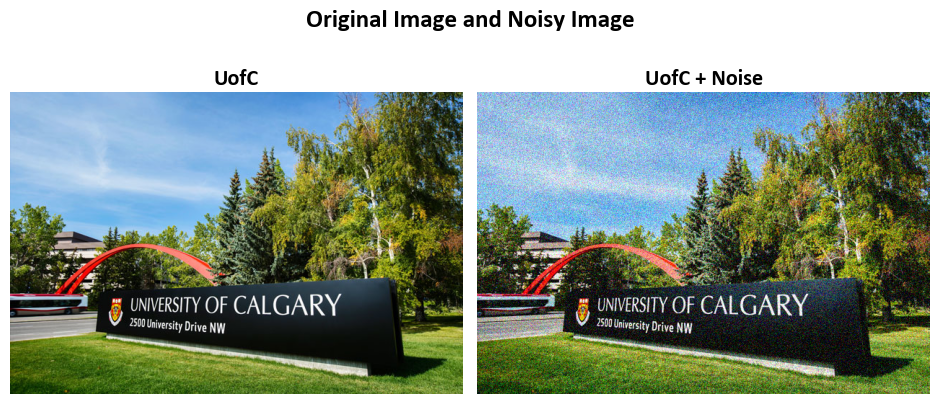

In [2]:
# Import necessary libraries
import numpy as np
import cv2
from skimage import io

# Load an image from a URL
Img = io.imread(r'https://conted.ucalgary.ca/maincampus/maincampus.jpg')

# Define a function that standardizes image values
def ImgStd(Inp):
    '''
    Standardizes image values.

    Parameters:
    Inp (numpy.ndarray): Input image.

    Returns:
    numpy.ndarray: Standardized image.
    '''
    Out = np.round(Inp).astype(int)  # Round the input values and convert to integers
    Out[Out < 0] = 0  # Set any negative values to 0
    Out[Out > 255] = 255  # Set any values above 255 to 255 (maximum pixel value)
    return Out.astype('uint8')  # Return the standardized image

# Define the parameters for generating a noisy image
mu = 0  # Mean of the noise
sigma = 30  # Standard deviation of the noise

# Create a noisy image by adding Gaussian noise to a copy of the original image
Img_noise = Img.copy() - np.random.normal(mu, sigma, size=Img.shape)

# Standardize the noisy image using the defined ImgStd function
Img_noise = ImgStd(Img_noise)

# Display the original image and the noisy image side by side
_ = ImShow(Images=[Img, Img_noise],
           Names=['UofC', 'UofC + Noise'],
           title='Original Image and Noisy Image')

### 2D Convolution (Image Filtering)


1. **Padding**:
   Padding is a technique used in convolutional operations to control the spatial dimensions of the output feature map. It involves adding extra rows and columns of zeros around the input image before applying the convolution operation. Padding is typically used to:

   - **Preserve Spatial Dimensions**: Padding helps maintain the spatial dimensions of the output feature map, ensuring that it has the same size as the input. This can be important when you want to preserve spatial information.

   - **Mitigate Boundary Effects**: Without padding, the convolution operation tends to lose information near the image borders. Padding helps mitigate this issue by allowing the kernel to process pixels at the image boundaries more effectively.

   In OpenCV (cv2), you can specify the type of padding you want when using the `cv2.filter2D()` function. Common padding modes include 'valid' (no padding), 'same' (padding to match the output size with the input size), and 'full' (maximum padding to ensure the kernel covers the entire input).

2. **Strides**:
   Strides determine how the convolutional kernel moves or steps across the input image during the convolution operation. A stride value of 1 means the kernel moves one pixel at a time, while a stride value greater than 1 means it skips some pixels.

   - **Stride of 1**: A stride of 1 processes each pixel in the input image, resulting in output feature maps with similar spatial dimensions as the input.

   - **Stride greater than 1**: A larger stride value skips pixels, resulting in output feature maps with reduced spatial dimensions. This can be useful for downsampling and reducing computational complexity.

In OpenCV (cv2), you can specify the stride when using the `cv2.filter2D()` function. By default, the stride is set to 1, but you can modify it to control the spatial downsampling or upsampling effect.

```{figure} Conv3by3.gif
---
width: 500px
align: center
---
Illustration of the convolution process using a 3 by 3 kernel applied to a 5 by 5 matrix with a stride of 1 and padding of 1.
```

`````{admonition} Remark
:class: important

To determine the size of padding required based on the size of the kernel and the desired stride, you can use the following formula:

\begin{equation} \text{Padding size} = \left\lfloor \frac{\text{Kernel size} - 1}{2} \right\rfloor \times \text{Stride} \end{equation}

Here's what each component means:

- **Padding size**: This is the size of the padding you need to add to the input image or matrix.
- **Kernel size**: This refers to the dimensions of your convolutional kernel. For example, a 3x3 kernel has a size of 3.
- **Stride**: The stride determines how much the kernel moves between each convolution operation. A stride of 1 means it moves one step at a time.

Let's consider an example:

Suppose you have a 3x3 kernel and you want to apply it with a stride of 2. Using the formula:

\begin{equation} \text{Padding size} = \left\lfloor \frac{3 - 1}{2} \right\rfloor \times 2 = \left\lfloor \frac{2}{2} \right\rfloor \times 2 = 1 \times 2 = 2 \end{equation}

Thus, in this case, you would need to add a padding of 2 units around your input image or matrix to achieve the desired stride of 2 while maintaining the dimensions.

`````

The `cv2.filter2D()` function applies an arbitrary linear filter to an image. In-place operation is supported. When the aperture is partially outside the image, the function interpolates outlier pixel values according to the specified border mode.

The function does actually compute correlation, not the convolution {cite:p}`opencv_library, OpenCVDocumentation`:

\begin{equation}
\text{dst} (x,y) = \sum _{ \substack{0\leq x' < \text{kernel.cols}\\{0\leq y' < \text{kernel.rows}}}} \text{kernel} (x',y')* \text{src} (x+x'- \text{anchor.x} ,y+y'- \text{anchor.y} )
\end{equation} 


`````{admonition} Note
:class: warning

1. **Correlation vs. Convolution**:
   - The statement "The function does actually compute correlation, not the convolution" refers to the mathematical operation performed by the `cv2.filter2D()` function. In image processing, correlation and convolution are closely related operations, but they differ in how the kernel is applied to the image.
   - Correlation in this context means that the kernel is applied directly without flipping (mirroring) it. Convolution, on the other hand, involves flipping the kernel before applying it. This distinction can be significant in certain image processing tasks.

2. **`dst` (x, y)**:
   - This notation represents a pixel in the destination image (`dst`) that is being calculated or modified. The `(x, y)` coordinates indicate the position of this pixel in the output image.

3. **Summation (Σ)**:
   - The summation symbol Σ represents a mathematical sum. In this context, it is used to indicate that a series of calculations are performed, and the results are summed up.

4. **Subscript Notation (`kernel.cols` and `kernel.rows`)**:
   - `kernel.cols` and `kernel.rows` refer to the number of columns and rows in the kernel, respectively. These values determine the dimensions of the kernel matrix.

5. **`kernel` (x', y')**:
   - This notation signifies a specific element within the kernel matrix. `x'` and `y'` are the indices used to access individual elements within the kernel. The `kernel` matrix contains the values that are applied to the corresponding pixels in the source image during the filtering process.

1. **`src` (x + x' - `anchor.x`, y + y' - `anchor.y`)**:
   - Here, `src` represents the source image, and `(x, y)` are the coordinates of the pixel in the destination image (`dst`) that is currently being computed. `x'` and `y'` are used to traverse the kernel matrix, and `anchor.x` and `anchor.y` specify the relative position of the anchor point within the kernel. This expression calculates the contribution of a pixel in the source image to the destination image based on the kernel and anchor point positions.

`````

<!-- That is, the kernel is not mirrored around the anchor point. If you need a real convolution, flip the kernel using flip and set the new anchor to (kernel.cols - anchor.x - 1, kernel.rows - anchor.y - 1). -->


The Python function `cv2.filter2D()` is a method from the OpenCV (Open Source Computer Vision Library) used for applying a custom convolutional filter to an input image (source) in order to perform image processing operations.

```
cv2.filter2D(src, ddepth, kernel[, dst[, anchor[, delta[, borderType]]]]) -> dst
```

- **src**: This parameter represents the input image, often referred to as the "source" image, on which the filter operation is applied. It's a mandatory argument and should be a multi-channel image (e.g., RGB or grayscale).

- **ddepth**: This specifies the desired depth of the output image (destination). It determines the data type of the destination image, which can be different from the source image. Common data types include `cv2.CV_8U` for 8-bit unsigned integers, `cv2.CV_32F` for 32-bit floating-point numbers, etc.

- **kernel**: The kernel is a user-defined convolution matrix that defines the filter's behavior. This parameter is essential and should be a numerical matrix (numpy array) used for filtering the source image. The kernel defines the weights applied to the image pixels to compute the output.

- **dst** (optional): This is the destination image, which is where the filtered result is stored. If not provided, the function creates a new image to store the result. It should have the same size and type as the source image.

- **anchor** (optional): This parameter denotes the relative position within the kernel. It specifies the anchor point with respect to which the convolution operation is performed. The anchor point determines the alignment of the kernel over the source image.

- **delta** (optional): The value added to the filtered pixels, which can be used for contrast adjustment or to shift the intensity range of the output image.

- **borderType** (optional): This parameter determines the border mode applied when the kernel extends beyond the edges of the source image. Common border types include constant border, replicate border, reflect border, etc.

- **Returns**: The function returns the filtered image, which is the result of applying the specified kernel to the input image. The destination image (dst) contains the filtered output.

You can see the full description of the function [here](https://docs.opencv.org/2.4/modules/ocl/doc/image_filtering.html?highlight=filter2d#ocl-filter2d).

<font color='Blue'><b>Example</b></font>:

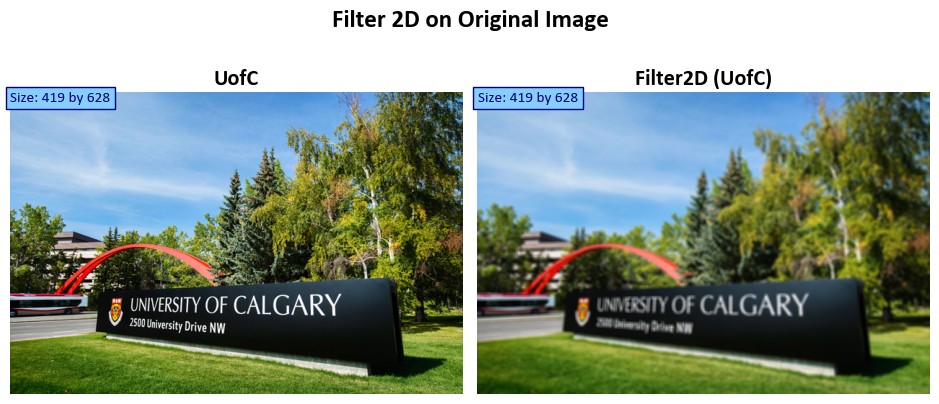

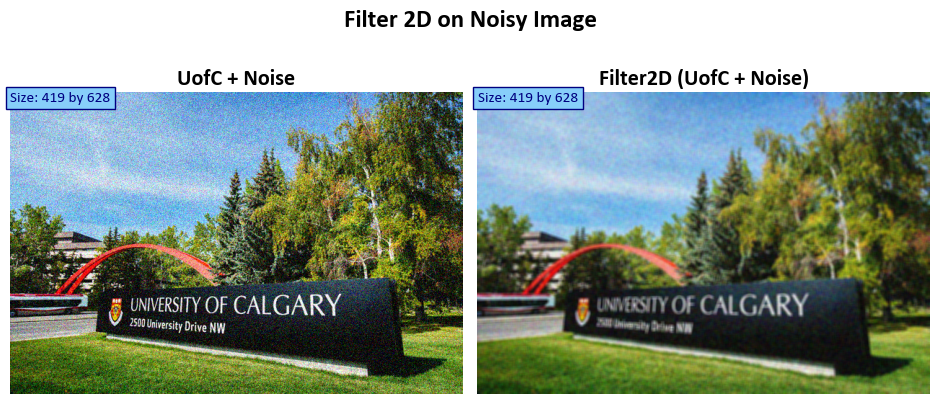

In [3]:
# Import necessary libraries
import numpy as np  # Import NumPy for array operations
import cv2  # Import OpenCV for image processing

# Define a kernel for filtering (5x5 averaging kernel)
kernel = np.ones((5, 5), np.float32) / 25

# Apply the filter2D operation to the original image
Out = cv2.filter2D(src=Img,  # Source image
                   ddepth=-1,  # Use the same depth as the source image
                   kernel=kernel  # 2D array of filter coefficients
                   )

# Display the original noisy image and the filtered image side by side
fig, ax = ImShow(Images=[Img, Out], Names=['UofC', 'Filter2D (UofC)'], title='Filter 2D on Original Image')

# Add text indicating the size of the original and transformed images
_ = ax[0].text(x=0, y=int(0.02 * Img.shape[1]), s=f'Size: {Img.shape[0]} by {Img.shape[1]}',
               size=11, color='Navy', bbox=dict(boxstyle="square", ec='Navy', fc='LightSkyBlue'))
_ = ax[1].text(x=0, y=int(0.02 * Out.shape[1]), s=f'Size: {Out.shape[0]} by {Out.shape[1]}',
               size=11, color='Navy', bbox=dict(boxstyle="square", ec='Navy', fc='LightSkyBlue'))

# Apply the filter2D operation to the noisy image
Out = cv2.filter2D(src=Img_noise,  # Source image with noise
                   ddepth=-1,  # Use the same depth as the source image
                   kernel=kernel  # 2D array of filter coefficients
                   )

# Display the original noisy image and the filtered image side by side
fig, ax = ImShow(Images=[Img_noise, Out], Names=['UofC + Noise', 'Filter2D (UofC + Noise)'],
                 title='Filter 2D on Noisy Image')

# Add text indicating the size of the original and transformed images
_ = ax[0].text(x=0, y=int(0.02 * Img.shape[1]), s=f'Size: {Img.shape[0]} by {Img.shape[1]}',
               size=11, color='Navy', bbox=dict(boxstyle="square", ec='Navy', fc='LightSkyBlue'))
_ = ax[1].text(x=0, y=int(0.02 * Out.shape[1]), s=f'Size: {Out.shape[0]} by {Out.shape[1]}',
               size=11, color='Navy', bbox=dict(boxstyle="square", ec='Navy', fc='LightSkyBlue'))

## Image Blurring (Image Smoothing)

Image blurring, also known as image smoothing or image filtering, is a fundamental image processing technique employed to mitigate high-frequency components within an image, such as noise and edges. Its primary purpose is to eliminate undesired details, resulting in a more visually cohesive and smoother appearance. Various blurring methods exist, each serving distinct purposes {cite:p}`opencv_library, OpenCVDocumentation`:

1. **Gaussian Blur**: This technique employs a Gaussian kernel that convolves with the image pixels, producing a weighted average of neighboring pixels. These weights are determined by the Gaussian distribution, making it adept at reducing high-frequency noise while preserving image structure.

2. **Median Blur**: In this approach, every pixel in the image is replaced with the median value of its neighboring pixels. It is particularly effective in removing "salt-and-pepper" noise, where isolated pixels have extreme intensity values, leading to a cleaner image.

3. **Bilateral Filter**: A non-linear filter that considers both spatial and intensity differences during the blurring process. It excels at noise reduction while retaining the sharpness of significant image features and edges.

4. **Box Blur**: Also known as average blur, this method replaces each pixel with the average value of its neighboring pixels. While providing a simple and uniform blurring effect, it may not preserve intricate image details as effectively as other methods.

5. **Motion Blur**: Simulates the effect of camera or object motion, creating streak-like artifacts within the image. This blurring technique imparts a sense of movement and dynamics to the scene.

These diverse blurring methods can be implemented using a range of image processing libraries, such as OpenCV in the Python programming language. The choice of a specific blurring technique hinges on the unique requirements of the application and the intrinsic characteristics of the image content, allowing practitioners to tailor the approach to their specific needs.

### (Average) Blur (Optional Content)

The `cv2.blur` function in Python serves to apply a straightforward averaging or blurring operation to an input image. The function encompasses several essential parameters, each of which governs the behavior of the blurring operation. Here's an enhanced description of the function signature {cite:p}`opencv_library, OpenCVDocumentation`:

```
cv2.blur(src, ksize[, dst[, anchor[, borderType]]) -> dst
```

- `src`: This parameter represents the input image (source) upon which the blurring operation is to be executed.

- `ksize`: A tuple that defines the size of the kernel or blurring filter. This specification indicates the dimensions of the local neighborhood over which the averaging occurs. Larger `ksize` values yield a more pronounced blur effect.

- `dst`: An optional parameter, this designates the output image (destination) where the result of the blurring operation is stored. If omitted, the function generates a new image to accommodate the result.

- `anchor`: This parameter, also optional, specifies the position of the anchor within the kernel. The anchor point identifies the kernel's pixel corresponding to the center of the neighborhood under processing. When unspecified, the default is the center of the kernel.

- `borderType`: Another optional parameter, it specifies the type of border extrapolation used when the kernel extends beyond the confines of the input image. Various border types are available to address this scenario, such as replicating border pixels, reflecting the image, or employing a constant value. If not explicitly provided, a default border type is employed.

- `-> dst`: This indicator signifies that the function yields the blurred output image (`dst`) subsequent to applying the specified blurring operation.

This blurring operation is achieved by convolving the image with a normalized box filter. The process involves calculating the average of all the pixels within the kernel area and subsequently replacing the central element. The function `cv2.blur()` or `cv2.boxFilter()` can be employed for this purpose. The mathematical representation of the kernel is as follows:

\begin{equation}
\text{K} =\frac{1}{\text{ksize.width*ksize.height}} \begin{bmatrix} 1 & 1 & 1 & \cdots & 1 & 1 \\ 1 & 1 & 1 & \cdots & 1 & 1 \\ 
\vdots & \vdots & \vdots &  & \vdots & \vdots  \\ 1 & 1 & 1 & \cdots & 1 & 1 \end{bmatrix}
\end{equation} 


For instance, a 3x3 normalized box filter appears as follows:

\begin{equation}
K = \frac{1}{9} \begin{bmatrix} 1 & 1 & 1 \\ 1 & 1 & 1 \\ 1 & 1 & 1 \end{bmatrix}
\end{equation}

You can see the full description of the function [here](https://docs.opencv.org/2.4/modules/imgproc/doc/filtering.html?highlight=blur#cv2.blur).

<font color='Blue'><b>Example</b></font>:

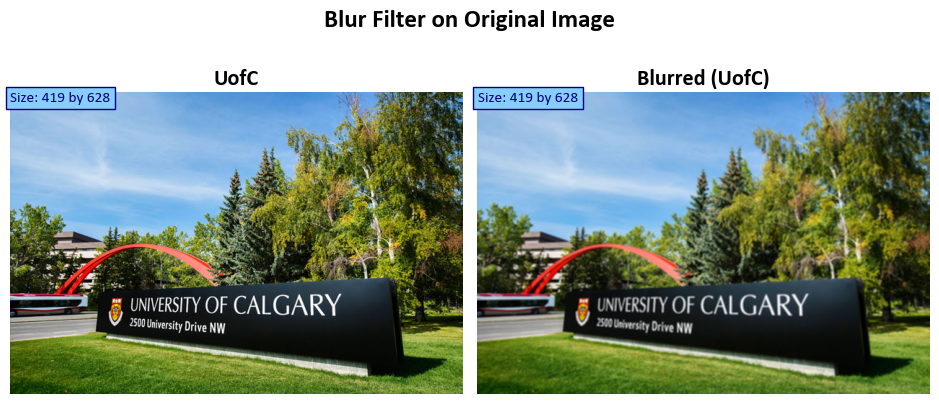

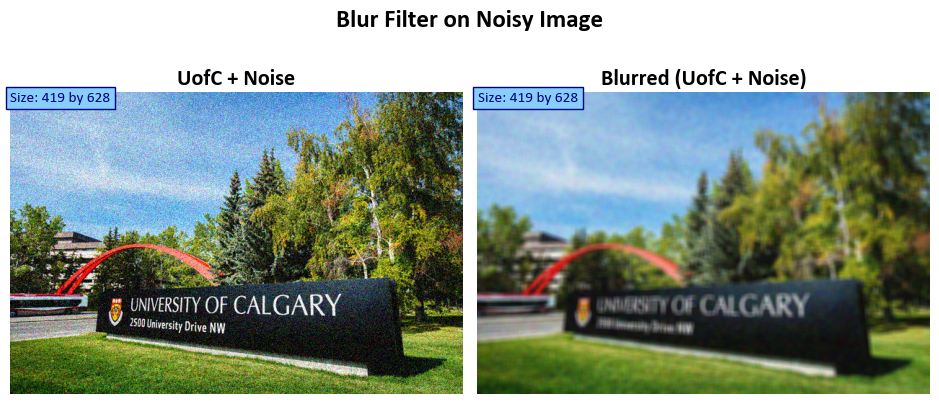

In [4]:
# Import necessary libraries
import numpy as np  # Import NumPy for array operations
import cv2  # Import OpenCV for image processing

# Apply the blur filter to the original image
Out = cv2.blur(src=Img,  # Source image
               ksize=(3, 3)  # Kernel size for blurring
              )

# Display the original noisy image and the filtered image side by side
fig, ax = ImShow(Images=[Img, Out], Names=['UofC', 'Blurred (UofC)'], title='Blur Filter on Original Image')

# Add text indicating the size of the original and transformed images
_ = ax[0].text(x=0, y=int(0.02 * Img.shape[1]), s=f'Size: {Img.shape[0]} by {Img.shape[1]}',
               size=11, color='Navy', bbox=dict(boxstyle="square", ec='Navy', fc='LightSkyBlue'))
_ = ax[1].text(x=0, y=int(0.02 * Out.shape[1]), s=f'Size: {Out.shape[0]} by {Out.shape[1]}',
               size=11, color='Navy', bbox=dict(boxstyle="square", ec='Navy', fc='LightSkyBlue'))

# Apply the blur filter to the noisy image
Out = cv2.blur(src=Img_noise,  # Source image with noise
               ksize=(8, 8)  # Kernel size for blurring
              )

# Display the original noisy image with noise and the filtered image side by side
fig, ax = ImShow(Images=[Img_noise, Out], Names=['UofC + Noise', 'Blurred (UofC + Noise)'],
                 title='Blur Filter on Noisy Image')

# Add text indicating the size of the original and transformed images
_ = ax[0].text(x=0, y=int(0.02 * Img.shape[1]), s=f'Size: {Img.shape[0]} by {Img.shape[1]}',
               size=11, color='Navy', bbox=dict(boxstyle="square", ec='Navy', fc='LightSkyBlue'))
_ = ax[1].text(x=0, y=int(0.02 * Out.shape[1]), s=f'Size: {Out.shape[0]} by {Out.shape[1]}',
               size=11, color='Navy', bbox=dict(boxstyle="square", ec='Navy', fc='LightSkyBlue'))

<font color='Blue'><b>Example</b></font>:

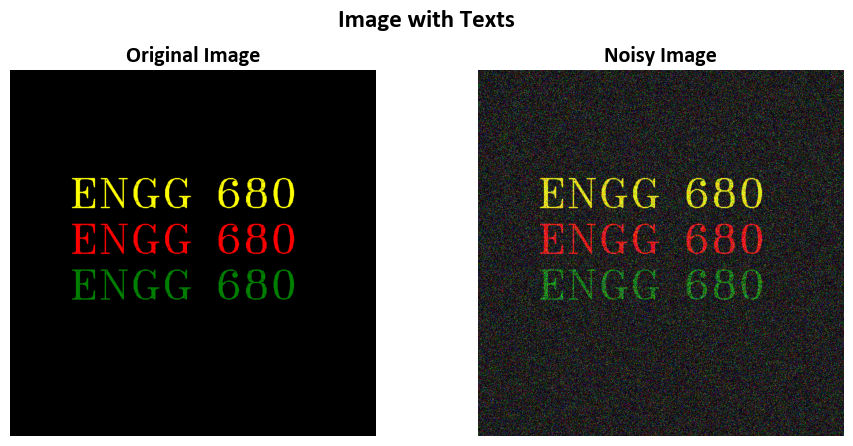

In [5]:
# Create an empty black image with a size of 800x800 pixels and 3 color channels
Img2 = np.zeros((800, 800, 3), np.uint8)

# Define the text to be added to the image
txt = 'ENGG 680'

# Add 'Sample Text' to the image with specified properties
Img2 = cv2.putText(Img2, text=txt, org=(130, 300),
                  fontFace=cv2.FONT_HERSHEY_TRIPLEX, fontScale=3, color = color2rgb('Yellow'), thickness=2)

# Add another instance of 'Sample Text' to the image with a different color and position
Img2 = cv2.putText(Img2, text=txt, org=(130, 400),
                  fontFace=cv2.FONT_HERSHEY_TRIPLEX, fontScale=3, color = color2rgb('Red'), thickness=2)

# Add one more 'Sample Text' to the image with a different color and position
Img2 = cv2.putText(Img2, text=txt, org=(130, 500),
                  fontFace=cv2.FONT_HERSHEY_TRIPLEX, fontScale=3, color=color2rgb('Green'), thickness=2)

# Generating a noisy image using mu = 0 and sigma = 80
mu = 0
sigma = 80
Img2_noise = Img2.copy() - np.random.normal(mu, sigma, size=Img2.shape)
Img2_noise = ImgStd(Img2_noise)  # Assuming ImgStd is a function for image standardization

# Display both the original image with text and the noisy image
_ = ImShow(Images=[Img2, Img2_noise],
           Names=['Original Image', 'Noisy Image'],
           title='Image with Texts')

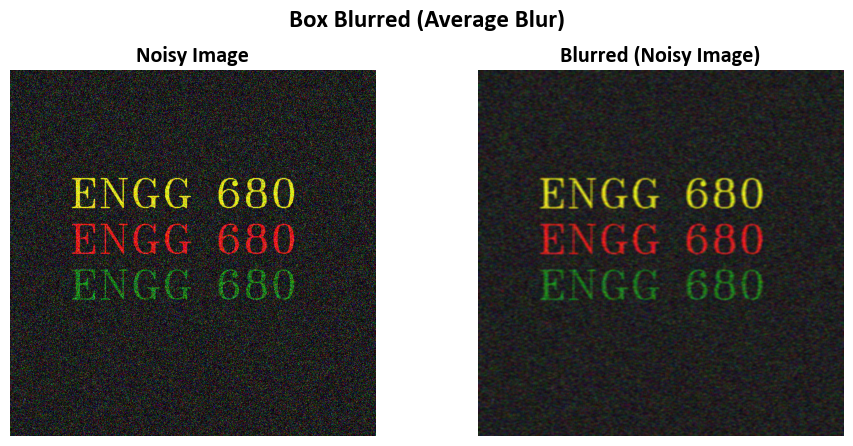

In [6]:
# Apply box blur (average blur) to the noisy image (Img2_noise)
Out = cv2.blur(Img2_noise, ksize=(6, 4))  # Applying an average blur with a kernel size of 8x8 pixels

# Display both the original noisy image and the blurred image side by side
_ = ImShow(Images=[Img2_noise, Out],
           Names=['Noisy Image', 'Blurred (Noisy Image)'],
           title='Box Blurred (Average Blur)')

Note that in this example, 

In [7]:
import numpy as np

ksize = (6, 4)
# Create a kernel matrix filled with ones (this is for a simple averaging blur)
kernel = np.ones(ksize, dtype=np.float32)
# Normalize the kernel by dividing it by the sum of its elements
kernel /= np.sum(kernel)
# Print the kernel matrix
print(kernel)

[[0.04166667 0.04166667 0.04166667 0.04166667]
 [0.04166667 0.04166667 0.04166667 0.04166667]
 [0.04166667 0.04166667 0.04166667 0.04166667]
 [0.04166667 0.04166667 0.04166667 0.04166667]
 [0.04166667 0.04166667 0.04166667 0.04166667]
 [0.04166667 0.04166667 0.04166667 0.04166667]]


### Box Filter (Optional Content)

The box filter is a blurring technique applied to an image using a specific kernel, which has the form of a matrix filled with ones. The primary purpose of this filter is to smooth the image. The blurring operation is performed by averaging the pixel values within a local neighborhood defined by the size of the kernel {cite:p}`opencv_library, OpenCVDocumentation`.

The mathematical representation of the kernel is as follows:

\begin{equation}
\text{K} = \alpha \begin{bmatrix} 1 & 1 & 1 & \cdots & 1 & 1 \\ 1 & 1 & 1 & \cdots & 1 & 1 \\ 
\vdots & \vdots & \vdots &  & \vdots & \vdots  \\ 1 & 1 & 1 & \cdots & 1 & 1 \end{bmatrix}
\end{equation} 
where
\begin{equation}
\alpha = \begin{cases} \frac{1}{\text{ksize.width*ksize.height}} & \text{when } \text{normalize=true} \\1 & \text{otherwise}\end{cases}
\end{equation} 

The unnormalized box filter has a specific utility in computing integral characteristics over each pixel neighborhood. For instance, it can be employed to calculate covariance matrices of image derivatives, which are used in various algorithms like dense optical flow algorithms. However, if the goal is to compute pixel sums over windows of varying sizes, the integral image approach should be utilized.


The Python function `cv2.boxFilter()` is a part of the OpenCV library, which is commonly used for computer vision tasks in Python. This function performs a box filter operation on an input image (source image) and returns the result in the destination image (if provided).

```
cv2.boxFilter(src, ddepth, ksize[, dst[, anchor[, normalize[, borderType]]]]) -> dst
```

- `src`: The source image, on which the box filter operation will be applied.
- `ddepth`: The desired depth of the destination image. It specifies the data type (e.g., `cv2.CV_8U`, `cv2.CV_32F`) of the output image. The result of the filtering will be converted to this depth.
- `ksize`: The size of the box filter kernel. It is a tuple `(ksize_x, ksize_y)` representing the width and height of the kernel. The kernel size must be positive and odd.
- `dst`: (Optional) The destination image where the filtered result will be stored. If not provided, a new image will be created to store the result.
- `anchor`: (Optional) The anchor point within the kernel. It specifies the relative position of the filtered pixel being computed. The default value is `(-1, -1)`, which means the anchor is at the center of the kernel.
- `normalize`: (Optional) A flag that indicates whether the kernel should be normalized or not. If set to `True`, the kernel is normalized to have a sum of 1. If set to `False`, no normalization is applied. The default value is `True`.
- `borderType`: (Optional) The type of border extrapolation. It determines how to handle pixels at the image borders. Common values are `cv2.BORDER_CONSTANT`, `cv2.BORDER_REPLICATE`, etc. The default value is `cv2.BORDER_DEFAULT`.

The function returns the destination image `dst` after applying the box filter operation on the source image with the specified parameters. The box filter is a simple and commonly used filter for smoothing and blurring images. It computes the average value of pixel intensities in a local neighborhood defined by the kernel size.

You can see the full description of the function [here](https://docs.opencv.org/2.4/modules/ocl/doc/image_filtering.html?highlight=filter2d#ocl-boxfilter).

`````{admonition} Remark
:class: important

The `blur` function call, using `blur(src, dst, ksize, anchor, borderType)`, is equivalent to using `boxFilter(src, dst, src.type(), anchor, **true**, borderType).'

`````

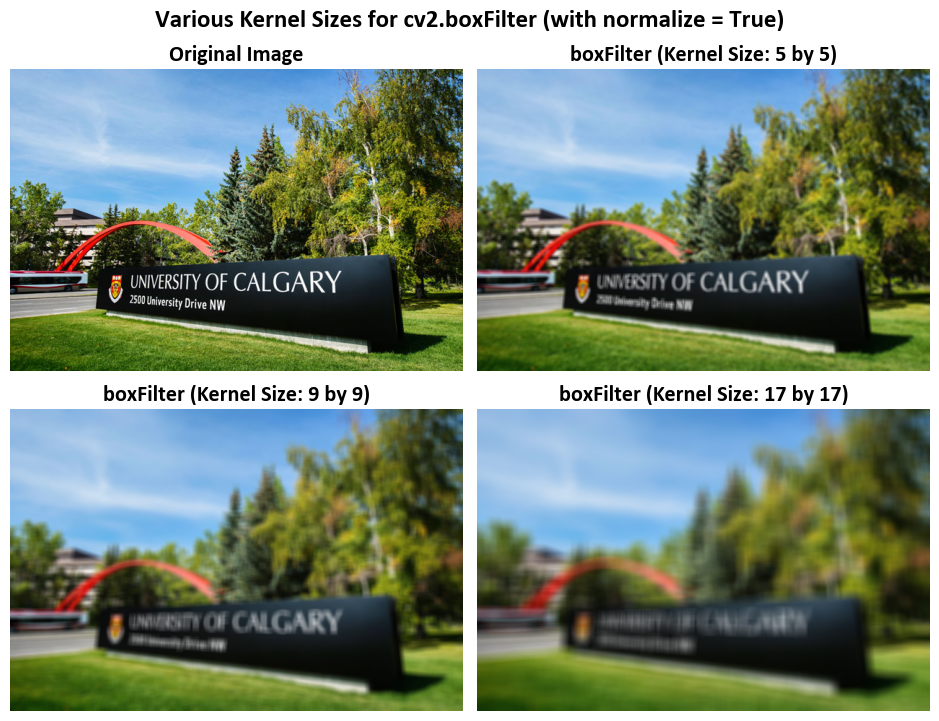

In [8]:
# Create a 2x2 grid of subplots for displaying images
fig, ax = plt.subplots(2, 2, figsize=(9.5, 7.5))
ax = ax.ravel()  # Flatten the subplots for easier manipulation

# Display the original image in the first subplot
_ = ax[0].imshow(Img)
_ = ax[0].set_title('Original Image', weight='bold')

# Loop to display images with box filtering at different kernel sizes
for i in range(1, 4):
    # Calculate the kernel size based on the loop iteration
    ksize_x = (2**(i-1)) * 4 + 1
    
    # Apply box filtering to the image and display it in the corresponding subplot
    _ = ax[i].imshow(cv2.boxFilter(src=Img, ddepth=-1, ksize = (ksize_x, ksize_x), normalize = True))
    
    # Set the title for the subplot with information about the kernel size
    _ = ax[i].set_title(f'boxFilter (Kernel Size: {ksize_x} by {ksize_x})', weight='bold')
     
# Additional settings for each subplot
for i in range(len(ax)):
    _ = ax[i].set_aspect(1)  # Set aspect ratio to 1 (square aspect)
    _ = ax[i].axis('off')    # Turn off axis

_ = fig.suptitle('Various Kernel Sizes for cv2.boxFilter (with normalize = True)', weight='bold', fontsize=18)
# Ensure tight layout for better spacing
plt.tight_layout()

### Gaussian Blur

The `cv2.GaussianBlur()` function in Python is a part of the OpenCV library, widely used for image processing and computer vision tasks. This function applies Gaussian blurring to an input image (source image) and returns the result in the destination image (if provided) {cite:p}`opencv_library, OpenCVDocumentation`.

This function is used to generate a Gaussian kernel, often used in image processing for tasks like blurring and smoothing. Let's break down the documentation and its parameters academically:

- `ksize`: This parameter represents the aperture size of the Gaussian kernel. It should be an odd, positive integer. In mathematical terms, it must satisfy the condition `(ksize % 2) == 1`. The kernel size determines the size of the kernel matrix.

- `sigma`: The Gaussian standard deviation. This parameter controls the spread or "width" of the Gaussian distribution. If it is non-positive (e.g., zero or negative), the function computes `sigma` from `ksize` using the formula `sigma = 0.3 * ((ksize - 1) * 0.5 - 1) + 0.8`. This calculation ensures that a reasonable standard deviation is chosen based on the kernel size.

- `ktype`: This parameter specifies the type of filter coefficients. It can take one of two values: `cv2.CV_32F` for 32-bit floating-point coefficients or `cv2.CV_64F` for 64-bit floating-point coefficients. The choice of data type affects the precision of the filter coefficients.

The function `cv2.getGaussianKernel` calculates and returns a `ksize x 1` matrix (column vector) containing the Gaussian filter coefficients. The coefficients are computed using the Gaussian function formula:

\begin{equation}G_i = \alpha \cdot \exp\left({-\frac{(i - \frac{{\text{ksize}} - 1}{2})^2}{2 \cdot \text{sigma}^2}}\right)
\end{equation}

Where:
- $i$ ranges from 0 to `ksize - 1`.
- $\alpha$ is a scale factor chosen so that the sum of all Gaussian filter coefficients equals 1: $\sum_i G_i = 1$.

The generated Gaussian kernel is typically used in image filtering operations to apply Gaussian smoothing to an image. Gaussian smoothing helps reduce noise and blur the image in a controlled manner. The kernel can be passed to functions like `sepFilter2D` or `createSeparableLinearFilter`, which are designed to work with kernels efficiently. Alternatively, you can use the higher-level function `GaussianBlur` in OpenCV to apply Gaussian smoothing directly to an image.

For more details, please see [Gaussian Blur](https://docs.opencv.org/2.4/modules/imgproc/doc/filtering.html?highlight=cv2.blur#gaussianblur).

The formula used in `cv2.getGaussianKernel` for computing Gaussian filter coefficients is a discretized version of the continuous Gaussian function. Let's explore the relationship between the two:

1. **Continuous Gaussian Function**:
   - The continuous Gaussian function is a mathematical function used to describe the Gaussian probability distribution. It's defined as:
   
     \begin{equation}G(x) = \frac{1}{\sqrt{2\pi\sigma^2}} e^{-\frac{(x - \mu)^2}{2\sigma^2}}\end{equation}

     - $x$ is the continuous independent variable.
     - $\mu$ (mu) is the mean (average) value.
     - $\sigma$ (sigma) is the standard deviation, controlling the spread or width.
     - $e$ is the base of the natural logarithm (approximately 2.71828).
     - $\pi$ is the mathematical constant pi (approximately 3.14159).

2. **Discretized Gaussian Kernel** (from `cv2.getGaussianKernel`):
   - The formula for computing $G_i$ in the discretized Gaussian kernel is as follows:

     \begin{equation}G_i = \alpha \cdot \exp\left(-\frac{(i - \frac{{\text{ksize}} - 1}{2})^2}{2 \cdot \text{sigma}^2}\right)\end{equation}

     - $i$ ranges from 0 to `ksize - 1`, representing discrete positions within the kernel.
     - $\frac{{\text{ksize}} - 1}{2}$ represents the center position of the kernel, ensuring symmetry.
     - $\text{sigma}$ is the standard deviation, controlling the width of the Gaussian distribution.
     - $\alpha$ is a scaling factor to normalize the kernel weights.

**Relationship**:
   - The relationship between the two formulas lies in their underlying concept.
   - The continuous Gaussian function describes a smooth, continuous distribution.
   - The discretized Gaussian kernel is an approximation of this continuous function, suitable for use in discrete systems like digital image processing.
   - By discretizing the Gaussian function, we obtain a set of discrete weights (the $G_i$ values) that approximate the behavior of the continuous Gaussian distribution.
   - These weights are used as coefficients in a convolution operation to achieve Gaussian smoothing or blurring in digital images.

<font color='Blue'><b>Example</b></font>:

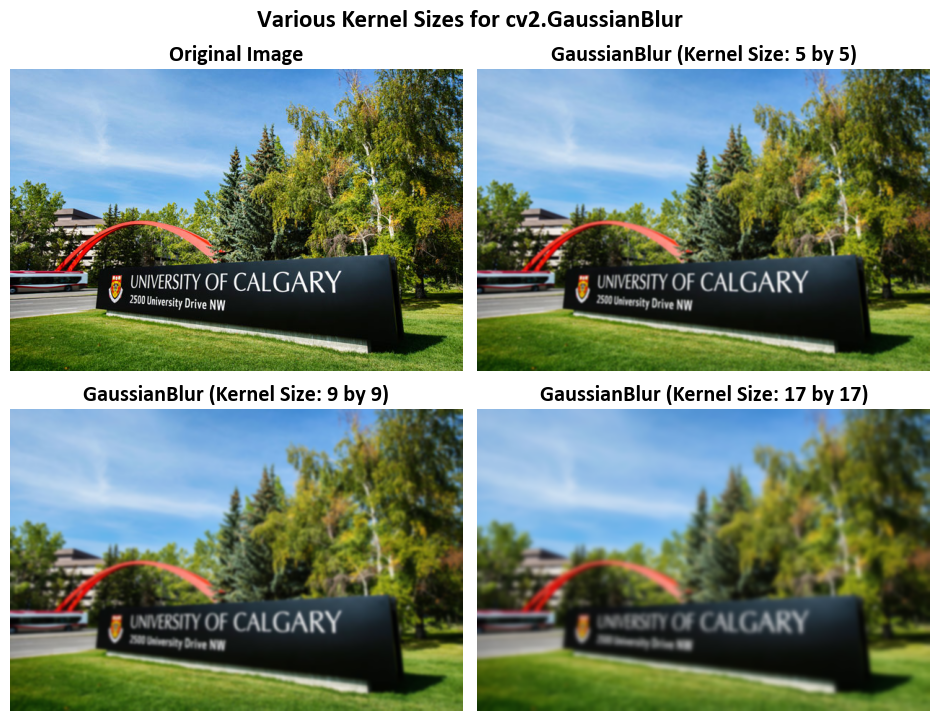

In [9]:
# Create a 2x2 grid of subplots for displaying images
fig, ax = plt.subplots(2, 2, figsize=(9.5, 7.5))
ax = ax.ravel()  # Flatten the subplots for easier manipulation

# Display the original image in the first subplot
_ = ax[0].imshow(Img)
_ = ax[0].set_title('Original Image', weight='bold')

# Loop to display images with Gaussian blur at different kernel sizes
for i in range(1, 4):
    # Calculate the kernel size based on the loop iteration
    ksize_x = (2**(i-1)) * 4 + 1
    
    # Apply Gaussian blur to the image and display it in the corresponding subplot
    _ = ax[i].imshow(cv2.GaussianBlur(src=Img, ksize=(ksize_x, ksize_x), sigmaX=0, sigmaY=0))
    
    # Set the title for the subplot with information about the kernel size
    _ = ax[i].set_title(f'GaussianBlur (Kernel Size: {ksize_x} by {ksize_x})', weight='bold')
    
# Additional settings for each subplot
for i in range(len(ax)):
    _ = ax[i].set_aspect(1)  # Set aspect ratio to 1 (square aspect)
    _ = ax[i].axis('off')    # Turn off axis

_ = fig.suptitle('Various Kernel Sizes for cv2.GaussianBlur', weight='bold', fontsize=18)
# Ensure tight layout for better spacing
plt.tight_layout()

Note that here

In [10]:
import numpy as np
from pprint import pprint

def gaussian_kernel_2d(ksize_x, ksize_y, sigma_x, sigma_y):
    kernel_x = cv2.getGaussianKernel(ksize_x, sigma_x)
    kernel_y = cv2.getGaussianKernel(ksize_y, sigma_y)
    kernel = kernel_x * kernel_y.T  # Use the outer product to create a 2D kernel
    return kernel

# Example usage
ksize_x = 5
ksize_y = 5
sigma_x = 0
sigma_y = 0
gaussian_kernel = gaussian_kernel_2d(ksize_x, ksize_y, sigma_x, sigma_y)
pprint(gaussian_kernel)

array([[0.00390625, 0.015625  , 0.0234375 , 0.015625  , 0.00390625],
       [0.015625  , 0.0625    , 0.09375   , 0.0625    , 0.015625  ],
       [0.0234375 , 0.09375   , 0.140625  , 0.09375   , 0.0234375 ],
       [0.015625  , 0.0625    , 0.09375   , 0.0625    , 0.015625  ],
       [0.00390625, 0.015625  , 0.0234375 , 0.015625  , 0.00390625]])


We can visualize this kernel.

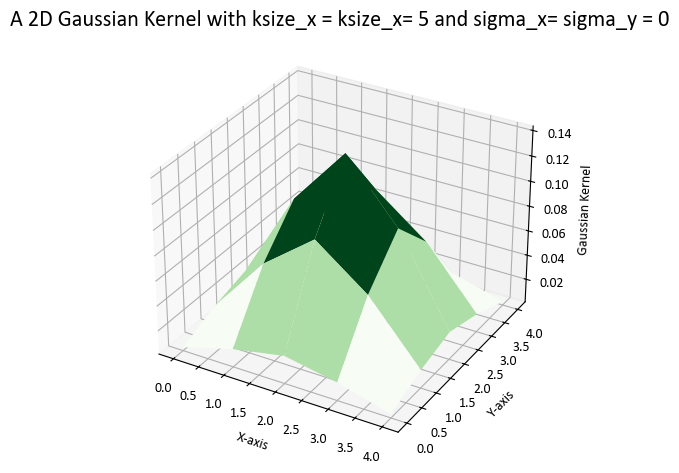

In [11]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Create a meshgrid to represent the 3D surface
x = np.arange(gaussian_kernel.shape[0])
y = np.arange(gaussian_kernel.shape[1])
X, Y = np.meshgrid(x, y)

# Create a figure and a 3D axis
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Plot the 3D surface
ax.plot_surface(X, Y, gaussian_kernel, cmap='Greens')

# Set labels for the axes
ax.set_xlabel('X-axis')
ax.set_ylabel('Y-axis')
ax.set_zlabel('Gaussian Kernel')

# Add a title to the plot
ax.set_title('A 2D Gaussian Kernel with ksize_x = ksize_x= 5 and sigma_x= sigma_y = 0')
plt.tight_layout()

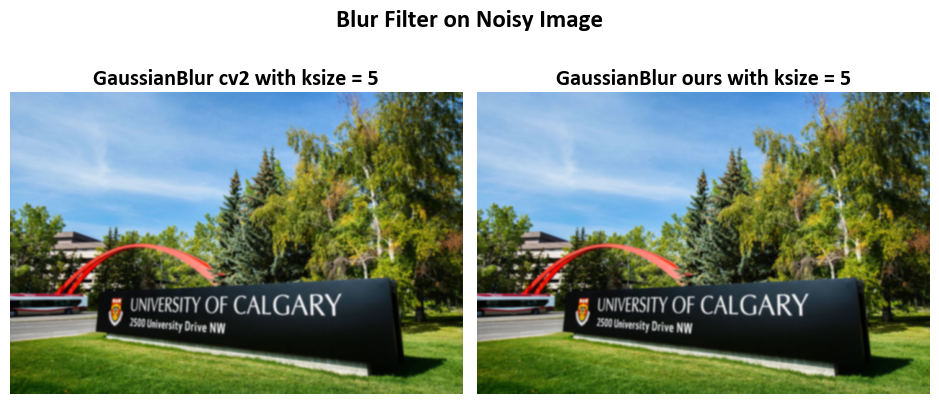

In [12]:
Img_Gauss_cv2 = cv2.GaussianBlur(src=Img, ksize=(ksize_x, ksize_x), sigmaX=0, sigmaY=0)
Img_Gauss_ours = cv2.filter2D(Img, -1, gaussian_kernel)

# Display the original noisy image with noise and the filtered image side by side
fig, ax = ImShow(Images=[Img_Gauss_cv2, Img_Gauss_ours],
                 Names=['GaussianBlur cv2 with ksize = 5', 'GaussianBlur ours with ksize = 5'],
                 title='Blur Filter on Noisy Image')

### Median Blur (Optional Content)

The median blur technique is a valuable image filtering method primarily used for noise reduction while preserving the edges and finer details in an image. This technique is especially effective at mitigating the impact of "salt-and-pepper" noise, which are isolated, randomly occurring bright or dark pixels that can distort the appearance of an image. The median blur operation computes the median value within a local neighborhood (specified by a kernel) for each pixel, effectively reducing the influence of noise outliers.

For a more detailed exploration of the median filter, you can refer to the research paper titled "[A Fast Two-Dimensional Median Filtering Algorithm](https://www.uio.no/studier/emner/matnat/ifi/INF2310/v12/undervisningsmateriale/artikler/Huang-etal-median.pdf)" by Thomas S. Huang et al. {cite:p}`huang1979fast`.

In OpenCV, the [Median Blur](https://docs.opencv.org/2.4/modules/imgproc/doc/filtering.html?highlight=cv2.blur#medianblur) function, denoted as `cv2.medianBlur()`, provides a convenient way to apply the median blur operation to an image. This function is widely used in computer vision tasks and image processing pipelines to enhance the quality of images by reducing noise while preserving important image structures.

<!-- The key advantage of median blur is its ability to effectively handle various types of noise, making it a crucial tool in image preprocessing and denoising applications. It's particularly useful when other blurring methods might smear the edges or fine features of an image, which is not the case with median blur. -->

**Function Signature:**
```
cv2.medianBlur(src, ksize[, dst]) -> dst
```

**Parameters:**
- `src`: The source image to which median blurring will be applied.
- `ksize`: The size of the median filter kernel. It specifies the window over which the median is computed. The kernel size must be a positive odd integer.
- `dst`: (Optional) The destination image where the median-blurred result will be stored. If not provided, a new image will be created to store the result.

The function employs a median filter to smooth an image, utilizing a square aperture of size `ksize x ksize`. It's important to note that each channel of a multi-channel image is processed independently, and the operation can be performed in-place if needed.

**Output:**
The function returns the destination image `dst` after applying median blurring to the source image with the specified parameters. Median blurring is a non-linear image filtering technique that is particularly effective at reducing salt-and-pepper noise in images.

**Note:**
- The median filter works by replacing the value of each pixel in the image with the median value of the pixel intensities within the specified window (kernel) centered around that pixel.
- Median blurring is especially useful for preserving edges and fine details in an image while reducing noise, making it a valuable tool in various image enhancement and denoising applications.
- The choice of `ksize` determines the size of the local neighborhood used for median computation. Larger `ksize` values provide more aggressive noise reduction but may also result in some loss of detail.
- OpenCV's `cv2.medianBlur()` function is a commonly used method for noise reduction and is a key component in image pre-processing pipelines.

<font color='Blue'><b>Example</b></font>:

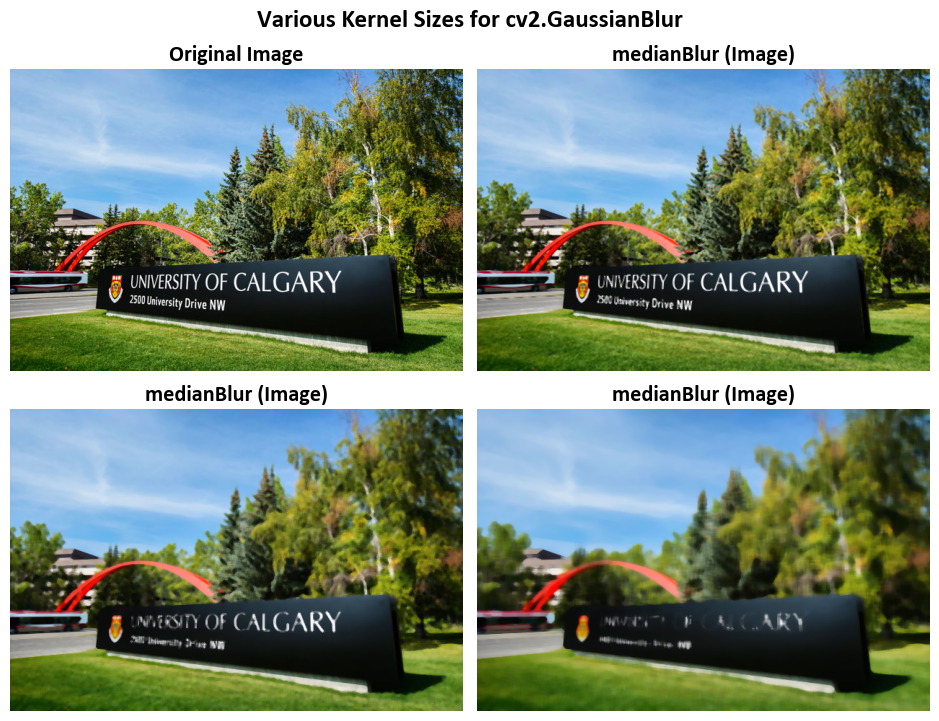

In [13]:
# Create a 2x2 grid of subplots for displaying images
fig, ax = plt.subplots(2, 2, figsize=(9.5, 7.5))
ax = ax.ravel()  # Flatten the subplots for easier manipulation

# Display the original image in the first subplot
_ = ax[0].imshow(Img)
_ = ax[0].set_title('Original Image', weight='bold')

# Loop to display images with median filtering at different kernel sizes
for i in range(1, 4):
    # Calculate the kernel size based on the loop iteration
    ksize_x = (2**(i-1)) * 2 + 1
    
    # Apply median filtering to the image and display it in the corresponding subplot
    _ = ax[i].imshow(cv2.medianBlur(Img, ksize_x, cv2.BORDER_DEFAULT))
    
    # Set the title for the subplot with information about the kernel size
    _ = ax[i].set_title('medianBlur (Image)', weight='bold')
        
# Additional settings for each subplot
for i in range(len(ax)):
    _ = ax[i].set_aspect(1)  # Set aspect ratio to 1 (square aspect)
    _ = ax[i].axis('off')    # Turn off axis

_ = fig.suptitle('Various Kernel Sizes for cv2.GaussianBlur', weight='bold', fontsize=18)
# Ensure tight layout for better spacing
plt.tight_layout()

### Bilateral Filtering (Optional Section)

A **bilateral filter** is a sophisticated image smoothing technique that is non-linear, preserves edges, and reduces noise. It operates by combining neighboring pixel values in a way that considers both the differences in pixel intensities (referred to as the "range") and the spatial distances between pixels. This unique combination allows the bilateral filter to effectively smooth an image while retaining important features such as edges.

The mathematical definition of the [bilateral filter](https://en.wikipedia.org/wiki/Bilateral_filter) can be expressed as:

\begin{equation}I^{\text{filtered}}(x) = \frac{1}{W_{p}} \sum_{x_{i}\in \Omega} I(x_{i}) f_{r}(\|I(x_{i})-I(x)\|) g_{s}(\|x_{i}-x\|).\end{equation}

Where:
- $I^{\text{filtered}}$ is the resulting filtered image.
- $I$ is the original input image to be filtered.
- $x$ represents the coordinates of the current pixel being filtered.
- $\Omega$ is the window centered at $x$, and $x_{i}$ refers to another pixel within this window.
- $f_r$ is the range kernel, used for smoothing differences in pixel intensities. This function is often represented as a Gaussian function.
- $g_{s}$ is the spatial (or domain) kernel, used for smoothing differences in pixel coordinates. This function is often represented as a Gaussian function.
- $W_{p}$ is the normalization term, which ensures that the filtered pixel value is properly weighted based on the contributions of neighboring pixels.

For a detailed understanding of the bilateral filter, you can refer to the article [Bilateral Filtering for Gray and Color Images](http://www.dai.ed.ac.uk/CVonline/LOCAL_COPIES/MANDUCHI1/Bilateral_Filtering.html). Additionally, for the adaptive bilateral filter, you may be interested in the work by Gavaskar et al. {cite:p}`gavaskar2018fast`.

The `cv2.bilateralFilter()` function in Python is a part of the OpenCV library, commonly used for image processing tasks. This function applies bilateral filtering to an input image (source image) and returns the result in the destination image (if provided) {cite:p}`opencv_library, OpenCVDocumentation`.

**Function Signature:**
```
cv2.bilateralFilter(src, d, sigmaColor, sigmaSpace[, dst[, borderType]]) -> dst
```

**Parameters:**
- `src`: The source image to which bilateral filtering will be applied.
- `d`: Diameter of each pixel neighborhood used for filtering. It specifies the size of the pixel neighborhood, which affects the amount of blurring. Larger `d` values result in more smoothing across a wider region.
- `sigmaColor`: The standard deviation of the color space. It influences the color similarity between the central pixel and its neighbors. A larger `sigmaColor` value allows for more variation in color within the neighborhood while still preserving edges.
- `sigmaSpace`: The standard deviation of the coordinate space. It influences the spatial proximity between the central pixel and its neighbors. A larger `sigmaSpace` value causes pixels that are farther away from the central pixel to have a reduced influence on the filtering.
- `dst`: (Optional) The destination image where the filtered result will be stored. If not provided, a new image will be created to store the result.
- `borderType`: (Optional) The type of border extrapolation. It determines how to handle pixels at the image borders. Common values are `cv2.BORDER_CONSTANT`, `cv2.BORDER_REPLICATE`, etc. The default value is `cv2.BORDER_DEFAULT`.

**Output:**
The function returns the destination image `dst` after applying bilateral filtering to the source image with the specified parameters. Bilateral filtering is a non-linear filtering technique that preserves edges in the image while reducing noise, making it especially useful for image smoothing without blurring important features.

**Note:**
- The bilateral filter considers both the intensity differences (controlled by `sigmaColor`) and the spatial distances (controlled by `sigmaSpace`) between pixels. This makes it effective at preserving edges and fine details while reducing noise.
- The `d` parameter determines the size of the filtering neighborhood, and both `sigmaColor` and `sigmaSpace` control the extent of blurring. Adjusting these parameters allows users to achieve the desired level of smoothing.
- The `cv2.bilateralFilter()` function is a versatile tool for various image enhancement tasks, denoising, and detail-preserving smoothing in computer vision applications.

See [Bilateral Filtering](https://docs.opencv.org/2.4/modules/imgproc/doc/filtering.html?highlight=cv2.blur#bilateralfilter) for more details.

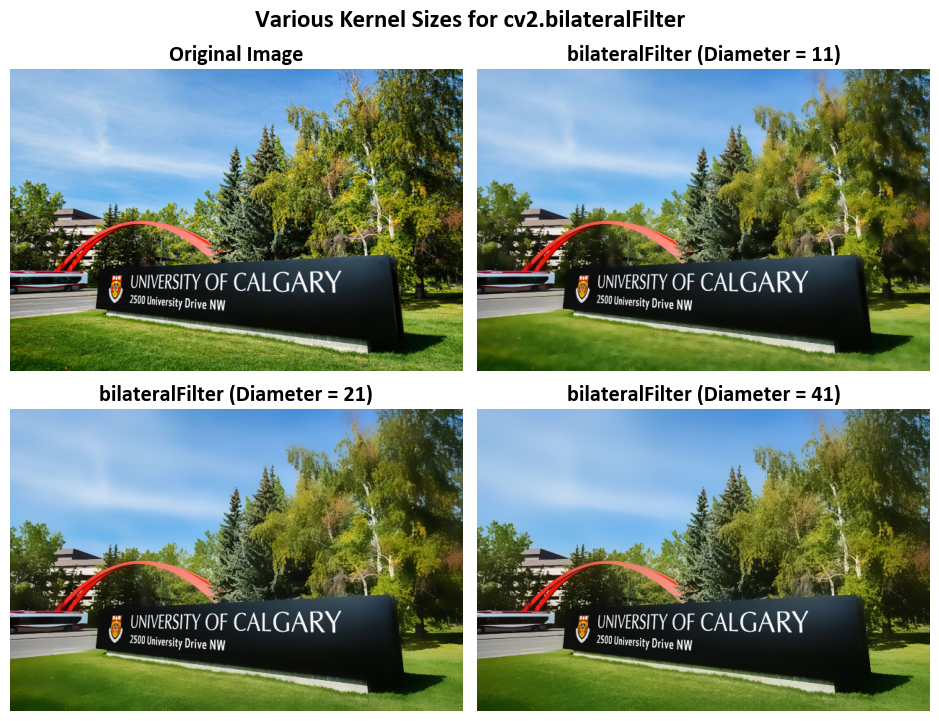

In [14]:
# Create a 2x2 grid of subplots for displaying images
fig, ax = plt.subplots(2, 2, figsize=(9.5, 7.5))
ax = ax.ravel()  # Flatten the subplots for easier manipulation

# Display the original image in the first subplot
_ = ax[0].imshow(Img)
_ = ax[0].set_title('Original Image', weight='bold')

# Loop to display images with bilateral filtering at different diameters
for i in range(1, 4):
    # Calculate the diameter based on the loop iteration
    diameter = (2**(i-1)) * 10 + 1
    
    # Apply bilateral filtering to the image and display it in the corresponding subplot
    _ = ax[i].imshow(cv2.bilateralFilter(src=Img, d=diameter, sigmaColor=75, sigmaSpace=75))
    
    # Set the title for the subplot with information about the diameter
    _ = ax[i].set_title(f'bilateralFilter (Diameter = {diameter})', weight='bold')
    
# Additional settings for each subplot
for i in range(len(ax)):
    _ = ax[i].set_aspect(1)  # Set aspect ratio to 1 (square aspect)
    _ = ax[i].axis('off')    # Turn off axis

_ = fig.suptitle('Various Kernel Sizes for cv2.bilateralFilter', weight='bold', fontsize=18)
# Ensure tight layout for better spacing
plt.tight_layout()

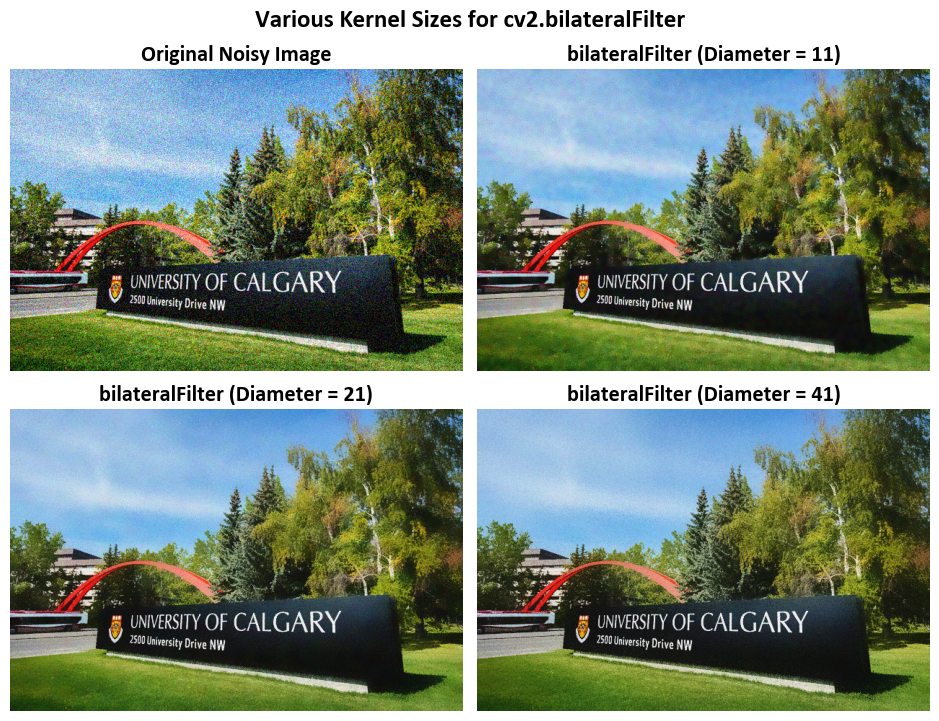

In [15]:
# Create a 2x2 grid of subplots for displaying images
fig, ax = plt.subplots(2, 2, figsize=(9.5, 7.5))
ax = ax.ravel()  # Flatten the subplots for easier manipulation

# Display the original noisy image in the first subplot
_ = ax[0].imshow(Img_noise)
_ = ax[0].set_title('Original Noisy Image', weight='bold')

# Loop to display images with bilateral filtering at different diameters
for i in range(1, 4):
    # Calculate the diameter based on the loop iteration
    diameter = (2**(i-1)) * 10 + 1
    
    # Apply bilateral filtering to the noisy image and display it in the corresponding subplot
    _ = ax[i].imshow(cv2.bilateralFilter(src=Img_noise, d=diameter, sigmaColor=75, sigmaSpace=75))
    
    # Set the title for the subplot with information about the diameter
    _ = ax[i].set_title(f'bilateralFilter (Diameter = {diameter})', weight='bold')

# Additional settings for each subplot
for i in range(len(ax)):
    _ = ax[i].set_aspect(1)  # Set aspect ratio to 1 (square aspect)
    _ = ax[i].axis('off')    # Turn off axis

_ = fig.suptitle('Various Kernel Sizes for cv2.bilateralFilter', weight='bold', fontsize=18)
# Ensure tight layout for better spacing
plt.tight_layout()

## Feature Detection

### Sobel Derivatives

**Sobel Operator**
1. The Sobel Operator is a mathematical tool commonly used in image processing. Its primary purpose is to help us understand how rapidly the intensity of an image changes at each point. In simpler terms, it helps identify edges and details within an image {cite:p}`OpenCVDocumentation`.

2. What makes the Sobel Operator particularly useful is that it combines two fundamental image processing techniques: smoothing and differentiation {cite:p}`OpenCVDocumentation`.

**Formulation**

Assuming we have an image, denoted as $I$:

1. **Derivative Calculation:**
   - To begin, we want to find out how the image changes in the horizontal (left to right) direction. This is done by applying a mathematical operation called convolution between the image $I$ and a specific pattern called the "kernel." The kernel used for horizontal changes is denoted as $G_x$. When we have a 3x3 kernel, it looks like this:

   \begin{equation} G_x = \begin{bmatrix} -1 & 0 & +1 \\ -2 & 0 & +2 \\ -1 & 0 & +1 \end{bmatrix} \end{equation}

   - In parallel, we also want to know how the image changes vertically (from top to bottom). To do this, we apply another convolution with a different kernel called $G_y$, which, with a 3x3 size, appears as:

   \begin{equation} G_y = \begin{bmatrix} -1 & -2 & -1 \\ 0 & 0 & 0 \\ +1 & +2 & +1 \end{bmatrix} \end{equation}

   These convolution operations reveal how the intensity of the image varies in both horizontal and vertical directions.

2. **Gradient Approximation:**
   - Now that we have these two sets of information (horizontal and vertical changes), we want to combine them to find an overall measure of change at each point in the image. This is typically done using a method called the "gradient".

   - The gradient at each point is calculated as {cite:p}`OpenCVDocumentation`:

   \begin{equation} G = \sqrt{ G_{x}^{2} + G_{y}^{2} } \end{equation}

   This equation computes the magnitude of change by taking the square root of the sum of squared changes in both directions. It provides a measure of how "edgy" or "smooth" the image is at each point {cite:p}`OpenCVDocumentation`.

   - Alternatively, for simplicity and computational efficiency, we can use the "L1 Norm" to approximate the gradient:

   \begin{equation} G = |G_{x}| + |G_{y}| \end{equation}

   This version considers the absolute values of the changes in both directions and can still be useful in edge detection.
   

**Kernel Size and Accuracy**

When using a small kernel size, such as 3x3, the Sobel operator may produce noticeable inaccuracies in edge detection. This is because the Sobel operator is, fundamentally, an approximation of the derivative of an image {cite:p}`OpenCVDocumentation`.

**Improved Accuracy with Scharr Operator**

To address this issue and achieve higher accuracy, OpenCV provides the Scharr() function. The Scharr operator is not only faster but also more accurate than the standard Sobel function, especially when dealing with small kernel sizes {cite:p}`OpenCVDocumentation`.

**Scharr Kernels**

The Scharr operator implements the following kernels for gradient calculation:

- **Horizontal Changes ($G_x$):**
\begin{equation}
G_{x} = \begin{bmatrix} -3 & 0 & +3 \\ -10 & 0 & +10 \\ -3 & 0 & +3 \end{bmatrix}
\end{equation}

- **Vertical Changes ($G_y$):**
\begin{equation}
G_{y} = \begin{bmatrix} -3 & -10 & -3 \\ 0 & 0 & 0 \\ +3 & +10 & +3 \end{bmatrix}
\end{equation}

These Scharr kernels are designed to provide a more accurate estimation of gradient changes, especially in scenarios where fine details and small features need to be detected. They are particularly useful when working with kernel sizes as small as 3x3, where the standard Sobel operator might fall short in terms of accuracy.

For more in-depth information and practical examples on Sobel and Scharr operators, you can explore the [Sobel Derivatives](https://docs.opencv.org/2.4/doc/tutorials/imgproc/imgtrans/sobel_derivatives/sobel_derivatives.html?highlight=scharr) documentation. 

To determine the gradient magnitude ($G$) and direction ($\theta$) of edges for every pixel, the following mathematical expressions are applied {cite:p}`OpenCVDocumentation`:

\begin{align}
\text{Magnitude} && G &= \sqrt{G_x^2 + G_y^2}\\
\text{Direction} && \theta &= \arctan\left(\frac{G_y}{G_x}\right)
\end{align}

Here, $G$ represents the gradient magnitude, $G_x$ denotes the gradient in the horizontal direction, and $G_y$ signifies the gradient in the vertical direction. The direction of the edge, $\theta$, is determined through the inverse tangent of the ratio of $G_y$ to $G_x$.

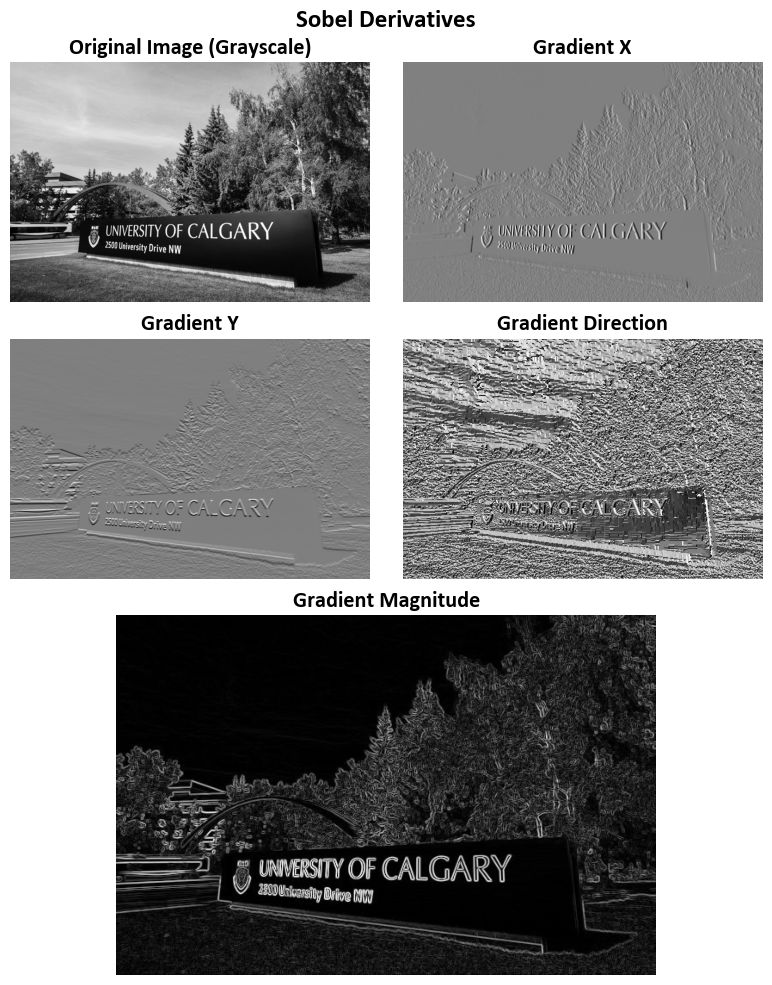

In [16]:
import cv2
import numpy as np
from skimage import io
import matplotlib.pyplot as plt

# Load and convert the image to grayscale
img_url = r'https://conted.ucalgary.ca/maincampus/maincampus.jpg'
img = cv2.cvtColor(io.imread(img_url), cv2.COLOR_BGR2GRAY)

# Calculate the gradient using the Sobel operator
gradient_x = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=3)  # Compute gradient in the x-direction
gradient_y = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize=3)  # Compute gradient in the y-direction

# Calculate the magnitude and direction of the gradient
gradient_magnitude = np.sqrt(gradient_x**2 + gradient_y**2)
gradient_direction = np.arctan2(gradient_y, gradient_x)

# Create a 3x2 grid of subplots for displaying images
fig, ax = plt.subplots(3, 2, figsize=(8, 10), gridspec_kw={'height_ratios': [1, 1, 1.5]})
ax = ax.ravel()
fig.delaxes(ax[-1])  # Remove the last subplot

# Plot the gradient components
images = [img, gradient_x, gradient_y, gradient_direction, gradient_magnitude]
titles = ['Original Image (Grayscale)', 'Gradient X', 'Gradient Y', 'Gradient Direction', 'Gradient Magnitude']

for i, (image, title) in enumerate(zip(images[:-1], titles)):
    ax[i].imshow(cv2.normalize(image, None, 0, 255, cv2.NORM_MINMAX, cv2.CV_8U), cmap='gray')
    # Additional settings for each subplot
    ax[i].set_title(title, weight='bold')
    ax[i].set_aspect(1)  # Set aspect ratio to 1 (square aspect)
    ax[i].axis('off')    # Turn off axis

gs = ax[-1].get_gridspec()
ax[4].remove()
ax1 = fig.add_subplot(gs[2, :])
ax1.imshow(cv2.normalize(images[-1], None, 0, 255, cv2.NORM_MINMAX, cv2.CV_8U), cmap='gray')
ax1.set_title(titles[-1], weight='bold')
ax1.set_aspect(1)  # Set aspect ratio to 1 (square aspect)
ax1.axis('off') 

# Add a title to the entire figure
_ = fig.suptitle('Sobel Derivatives', weight='bold', fontsize=18)

# Ensure tight layout for better spacing
plt.tight_layout()

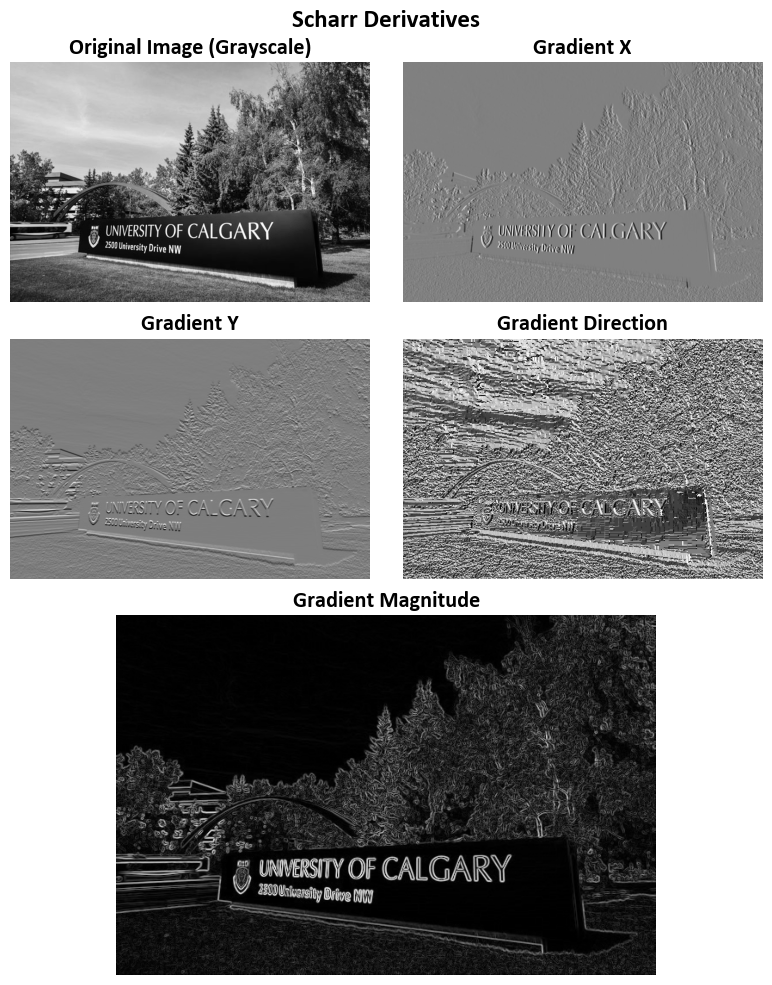

In [17]:
import cv2
import numpy as np
from skimage import io
import matplotlib.pyplot as plt

# Load and convert the image to grayscale
img_url = r'https://conted.ucalgary.ca/maincampus/maincampus.jpg'
img = cv2.cvtColor(io.imread(img_url), cv2.COLOR_BGR2GRAY)

# Calculate the gradient using the Scharr operator
gradient_x = cv2.Scharr(img, cv2.CV_64F, 1, 0)  # Compute gradient in the x-direction
gradient_y = cv2.Scharr(img, cv2.CV_64F, 0, 1)  # Compute gradient in the y-direction

# Calculate the magnitude and direction of the gradient
gradient_magnitude = np.sqrt(gradient_x**2 + gradient_y**2)
gradient_direction = np.arctan2(gradient_y, gradient_x)

# Create a 3x2 grid of subplots for displaying images
fig, ax = plt.subplots(3, 2, figsize=(8, 10), gridspec_kw={'height_ratios': [1, 1, 1.5]})
ax = ax.ravel()
fig.delaxes(ax[-1])  # Remove the last subplot

# Plot the gradient components
images = [img, gradient_x, gradient_y, gradient_direction, gradient_magnitude]
titles = ['Original Image (Grayscale)', 'Gradient X', 'Gradient Y', 'Gradient Direction', 'Gradient Magnitude']

for i, (image, title) in enumerate(zip(images[:-1], titles)):
    ax[i].imshow(cv2.normalize(image, None, 0, 255, cv2.NORM_MINMAX, cv2.CV_8U), cmap='gray')
    # Additional settings for each subplot
    ax[i].set_title(title, weight='bold')
    ax[i].set_aspect(1)  # Set aspect ratio to 1 (square aspect)
    ax[i].axis('off')    # Turn off axis

gs = ax[-1].get_gridspec()
ax[4].remove()
ax1 = fig.add_subplot(gs[2, :])
ax1.imshow(cv2.normalize(images[-1], None, 0, 255, cv2.NORM_MINMAX, cv2.CV_8U), cmap='gray')
ax1.set_title(titles[-1], weight='bold')
ax1.set_aspect(1)  # Set aspect ratio to 1 (square aspect)
ax1.axis('off') 

# Add a title to the entire figure
_ = fig.suptitle('Scharr Derivatives', weight='bold', fontsize=18)

# Ensure tight layout for better spacing
plt.tight_layout()

### Canny Edge Detection Algorithm

Canny Edge Detection is a widely employed algorithm for detecting edges in images, introduced by John F. Canny {cite:p}`canny1986computational`. This multi-stage algorithm involves the following key steps:

1. **Noise Reduction**: To mitigate the impact of image noise, a 5x5 Gaussian filter is applied to the image. This step aims to enhance the overall quality of the image by reducing noise artifacts {cite:p}`OpenCVDocumentation`.

2. **Intensity Gradient Calculation**: Following noise reduction, the smoothened image undergoes gradient calculations in both horizontal ($G_x$) and vertical ($G_y$) directions. These gradients are used to determine the edge gradient magnitude ($G$) and direction ($\theta$) for each pixel {cite:p}`OpenCVDocumentation`:

   \begin{align}
   G &= \sqrt{G_x^2 + G_y^2}\\
   \theta &= \tan^{-1} \left(\frac{G_y}{G_x}\right)
   \end{align}

   It's essential to note that the gradient direction is always perpendicular to the edges and is quantized to one of four angles, representing vertical, horizontal, and two diagonal directions {cite:p}`OpenCVDocumentation`.

3. **Non-maximum Suppression**: In this stage, a comprehensive scan of the image is conducted to eliminate extraneous pixels that do not constitute edges. For each pixel, a check is performed to ascertain if it is a local maximum within its neighborhood along the gradient direction. If a pixel qualifies as a local maximum, it is retained for subsequent stages; otherwise, it is suppressed (set to zero) {cite:p}`OpenCVDocumentation`.

```{figure} nms.jpg
---
width: 600px
align: center
---
Point A resides on the edge in the vertical direction, and the gradient direction aligns perpendicularly to this edge. Points B and C lie along the gradient directions. Point A is subject to evaluation by comparing it to points B and C to determine if it qualifies as a local maximum. If it meets this criterion, it proceeds to the subsequent stage of processing; otherwise, it undergoes suppression and is assigned a value of zero. Image courtesy of {cite:p}`OpenCVDocumentation`.
```

4. **Hysteresis Thresholding**: This stage is crucial for distinguishing genuine edges from non-edges. It relies on two threshold values, namely, minVal and maxVal. Pixels with intensity gradients exceeding maxVal are unequivocally identified as edges, while those falling below minVal are unequivocally classified as non-edges and discarded. Pixels falling between these two thresholds are assessed based on their connectivity to "sure-edge" pixels. If they are connected to such pixels, they are deemed part of the edges; otherwise, they are also discarded {cite:p}`OpenCVDocumentation`.



```{figure} hysteresis.jpg
---
width: 500px
align: center
---
Edge A surpasses the threshold maxVal, categorizing it as a "sure-edge." Conversely, while edge C falls below maxVal, its connectivity to edge A validates it as an edge, resulting in the formation of the complete curve. In contrast, edge B, despite exceeding minVal and residing within the same region as edge C, lacks connectivity to any "sure-edge" and is consequently discarded. Consequently, the precise selection of minVal and maxVal is of paramount importance in achieving accurate results. Image courtesy of {cite:p}`OpenCVDocumentation`.
```

   It's imperative to carefully select minVal and maxVal to obtain the desired results and effectively eliminate small pixel noise, as the algorithm assumes that edges correspond to elongated lines {cite:p}`OpenCVDocumentation`.

`````{admonition} Note
:class: warning

Please note that `minVal` and `maxVal` are represented as `threshold1` and `threshold2` in the cv2 library.

`````

### Canny Edge Detection in OpenCV

OpenCV conveniently encapsulates the Canny Edge Detection algorithm within a single function: `cv.Canny()`. Let's delve into its usage and parameters. 

- **Input Image**: The first argument is the input image on which edge detection is applied. 

- **Threshold Values**: The second and third arguments, denoted as minVal and maxVal respectively, establish the lower and upper thresholds for the edge detection process.

- **Aperture Size**: The fourth argument, aperture_size, signifies the size of the Sobel kernel employed for computing image gradients. By default, it assumes a size of 3.

- **L2 Gradient**: The last argument, L2gradient, is a Boolean parameter that specifies the equation for calculating gradient magnitude. When set to True, it employs the more accurate equation discussed earlier: $Edge\_Gradient \; (G) = \sqrt{G_x^2 + G_y^2}$. Conversely, when set to False, it employs the alternative function: $Edge\_Gradient \; (G) = |G_x| + |G_y|$.

### `cv2.Canny` Function

```python
cv2.Canny(image, threshold1, threshold2[, edges[, apertureSize[, L2gradient]]]) -> edges
```

Parameters:
- `image`: This is the input image on which the Canny edge detection is to be applied. It should be a single-channel 8-bit grayscale image.

- `threshold1`: The lower threshold value. It's an integer and is used to identify weaker edges. Pixels with gradient magnitudes below this threshold are discarded as non-edges.

- `threshold2`: The higher threshold value. It's also an integer and is used to identify stronger edges. Pixels with gradient magnitudes above this threshold are marked as strong edges.

- `edges` (optional): This is an output image that will store the edges found by the Canny algorithm. It should have the same size as the input image. This parameter is optional, and if not provided, the function returns the edge map directly.

- `apertureSize` (optional): This is the size of the Sobel kernel used for gradient calculation. It's an integer, and typical values are 3 (default) or 5. A larger aperture size can reduce noise, but it may also reduce sensitivity to small details in the image.

- `L2gradient` (optional): A Boolean parameter (True or False). If set to True, the function uses the $L_2$ gradient magnitude for gradient calculations. If set to False (default), it uses the $L_1$ gradient magnitude. Using $L_2$ gradient can result in slightly more accurate edge detection.

Return Value:
- `edges`: This is the output edge map, either provided as the `edges` parameter or returned by the function. It's a binary image where edge pixels are marked with white (255) and non-edge pixels with black (0).

For further details, refer to the [OpenCV documentation on Canny Edge Detection](https://docs.opencv.org/4.x/da/d22/tutorial_py_canny.html).

<font color='Blue'><b>Example:</b></font>

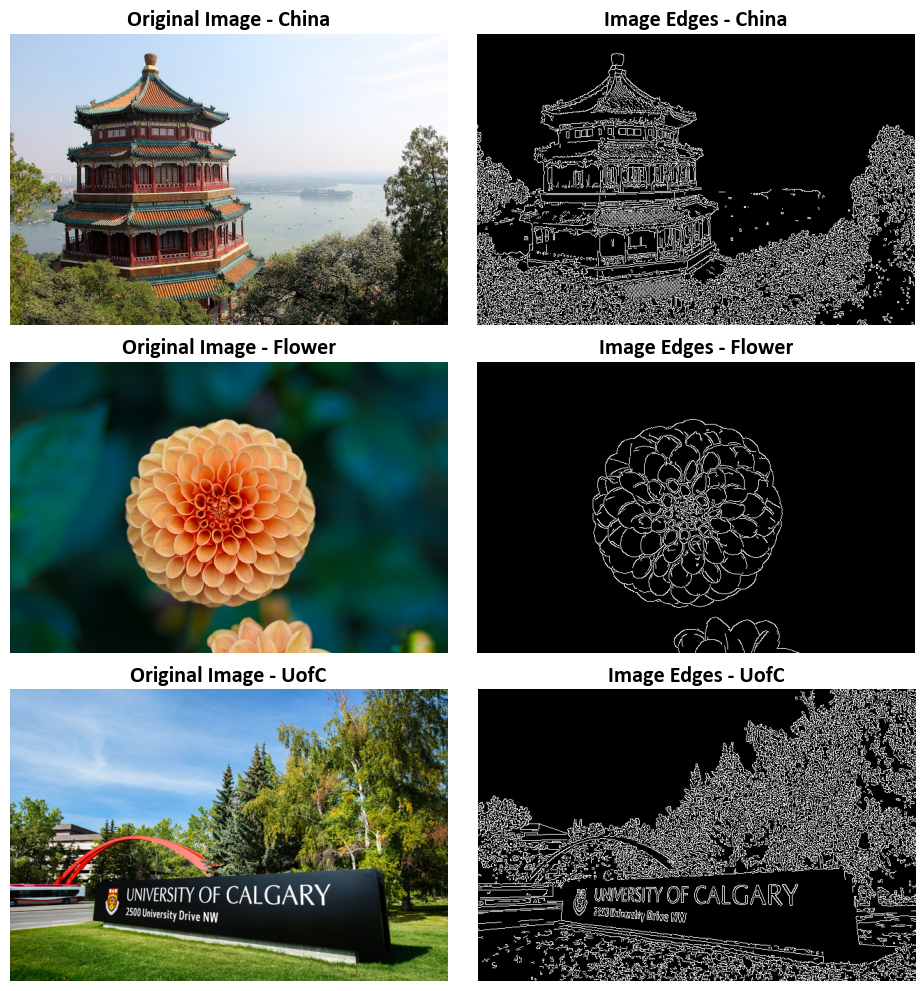

In [18]:
# Import necessary libraries
import matplotlib.pyplot as plt
from sklearn.datasets import load_sample_images 
from skimage import io
import cv2

# Load sample images
sample_images = load_sample_images()['images']
sample_names = [x.split("/")[-1].replace('.jpg', '').title() for x in load_sample_images()['filenames']]

# Load the custom image (UofC)
uofc_img_url = r'https://conted.ucalgary.ca/maincampus/maincampus.jpg'
uofc_img = io.imread(uofc_img_url)
sample_images.append(uofc_img)
sample_names.append('UofC')

# Create a 2x2 grid of subplots for displaying images
fig, ax = plt.subplots(len(sample_images), 2, figsize=(9.5, 10))
ax = ax.ravel()  # Flatten the subplots for easier manipulation

# Loop to display original images and their edges
for i, img in enumerate(sample_images):    
    # Display the original image in the left subplot
    ax[i*2].imshow(img, cmap='gray')
    ax[i*2].set_title(f'Original Image - {sample_names[i]}', weight='bold')
    
    # the original image in grayscale
    img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    edge_img = cv2.Canny(img, 100, 200)
    
    # Display the edge-detected image in the right subplot
    ax[i*2+1].imshow(edge_img, cmap='gray')
    ax[i*2+1].set_title(f'Image Edges - {sample_names[i]}', weight='bold')

# Additional settings for each subplot
for i in range(len(ax)):
    ax[i].set_aspect(1)  # Set aspect ratio to 1 (square aspect)
    ax[i].axis('off')    # Turn off axis
    
plt.tight_layout()